In [230]:
import pathlib
import pandas as pd
import numpy as np
from typing import Union
import matplotlib.pyplot as plt
import seaborn as sns
import clean_data_microscope as cdm
import files_process_save as fps

In [231]:
def clean_micro_df(micro_df: pd.DataFrame):
    """
    Cleans values of microscopic dataframes with all the cleansing functions

    Parameters
    ----------
    micro_df: pd.DataFrame

    Return
    ----------
    micro_df: pd.DataFrame
    """
    cdm.fix_object_cols_to_float(micro_df)
    cdm.remove_negatives(micro_df)
    return micro_df

In [275]:
micro_path = fps.check_file("micro - total.csv")
data_microscopic = pd.read_csv(micro_path)
data_microscopic['Time'] = pd.to_datetime(data_microscopic['Time'], dayfirst=True).dt.normalize()
data_microscopic = data_microscopic.set_index('Time')
data_microscopic = data_microscopic[~data_microscopic.index.duplicated(keep='first')]
data_microscopic = clean_micro_df(data_microscopic)

In [277]:
#data_microscopic

In [324]:
organisms_ist= [
            "arcella",
            "nude ameba",
            "aspidisca",
            "trachelopylum",
            "lionutus",
            "paramecium",
            "epistylis",
            "vorticella",
            "carchecium",
            "tokophyra",
            "podophyra",
            "opercularia",
            "rotifer",
            "nematode",
            "worms",
            "peranema trich",
            "micro flagellates",
            "spirochaetes",
            "Nocardia",
            "Microthrix",
            "N. Limicola",
            "Thiothrix",
            "0041_0675 ",
            "0092 ",
            "1851 ",
            "beggiatoa",
            "zoogloea"
        ]

In [335]:
### create 'tidy' dataframe
i=2
org_df = data_microscopic.iloc[:, np.r_[i, i+27, i+27*2, i+27*3]]
org_df = org_df.stack().reset_index()
org_df.columns = ['Time', 'Reactor', organisms_ist[i]]
for i in range(1,5):
    org_df = org_df.replace(f"{organisms_ist[i]}{i}", f"Reactor {i}")
org_df = org_df.sort_values(by=['Reactor'])
org_df['Month'] = pd.DatetimeIndex(org_df['Time']).month
org_df['Year'] = pd.DatetimeIndex(org_df['Time']).year
org_df['Season'] = org_df.Month.apply(lambda x: 'spring' if x >= 3 and x<=5 else(
                                                   'summer' if x >= 6 and x<=8 else( 
                                                   'fall' if x >= 9 and x<=11 else('winter'))))

In [336]:
org_df

,Time,Reactor,aspidisca,Month,Year,Season
0,2014-01-01,Reactor 2,10.0,1,2014,winter
144,2017-05-22,Reactor 2,4.0,5,2017,spring
145,2017-06-13,Reactor 2,25.0,6,2017,summer
405,2019-09-22,Reactor 2,20.0,9,2019,fall
147,2017-06-22,Reactor 2,15.0,6,2017,summer
...,...,...,...,...,...,...
173,2017-11-29,aspidisca4,2.0,11,2017,fall
392,2019-08-08,aspidisca4,95.0,8,2019,summer
163,2017-09-24,aspidisca4,5.0,9,2017,fall
156,2017-08-03,aspidisca4,2.0,8,2017,summer


([<matplotlib.axis.XTick at 0x4b1659f448>,
 <a list of 13 Text xticklabel objects>)

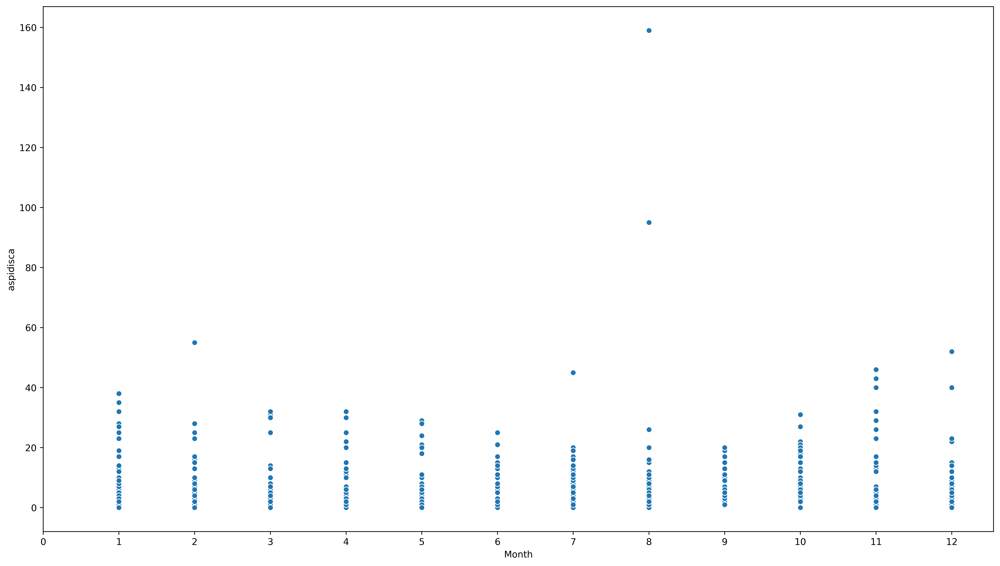

In [337]:
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
g = sns.scatterplot(data=org_df, x="Month", y=org_df.iloc[:,2], ax=ax)
plt.xticks(np.arange(0, 13, step=1))

Text(0.5, 1, 'aspidisca')

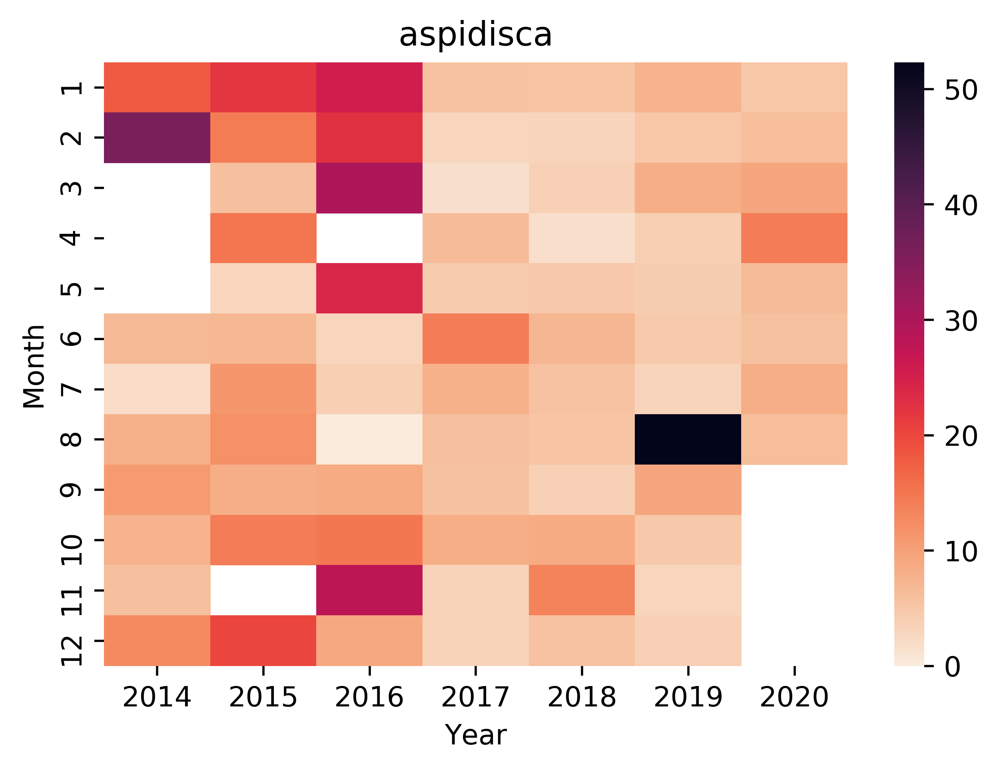

In [346]:
table = pd.pivot_table(org_df, values=org_df.columns[2], index=['Month'], columns=['Year'])
ax = sns.heatmap(table, cmap="rocket_r")
plt.title(org_df.columns[2])

In [280]:
#sns.distplot(aspidisca_df["aspidisca"])

In [278]:
### plot scater plot with seaborn with col
#g = sns.relplot('Time', 'aspidisca', data=aspidisca_df, hue='Reactor', col="Season")
#plt.xlim(aspidisca_df['Time'].min(), aspidisca_df['Time'].max())


(735234.0, 737664.0)

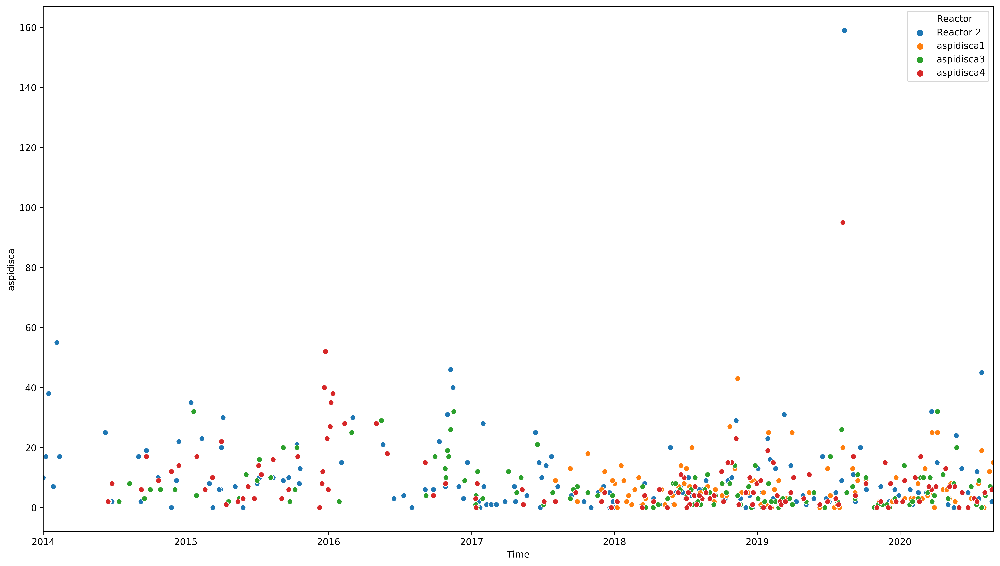

In [347]:
### plot scater plot with seaborn
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
g = sns.scatterplot(data=org_df, x="Time", y=org_df.columns[2], hue="Reactor", ax=ax)
plt.xlim(org_df['Time'].min(), org_df['Time'].max())

In [348]:
### create 'tidy' dataframes for all microorganisms
micro_df_list = []
for i in range (0, 27):
    micro_org_df = data_microscopic.iloc[:, np.r_[i, i+27, i+27*2, i+27*3]]
    micro_org_df = micro_org_df.stack().reset_index()
    micro_org_df.columns = ['Time', 'Reactor', organisms_ist[i]]
    for j in range(1,5):
        micro_org_df = micro_org_df.replace(f"{organisms_ist[i]}{j}", f"Reactor {j}")
    micro_org_df = micro_org_df.sort_values(by=['Reactor'])
    micro_org_df['Month'] = pd.DatetimeIndex(micro_org_df['Time']).month
    micro_org_df['Year'] = pd.DatetimeIndex(micro_org_df['Time']).year
    micro_org_df['Season'] = micro_org_df.Month.apply(lambda x: 'spring' if x >= 3 and x<=5 else(
                                               'summer' if x >= 6 and x<=8 else( 
                                               'fall' if x >= 9 and x<=11 else('winter'))))
    micro_df_list.append(micro_org_df)


In [349]:
micro_df_list[0]

,Time,Reactor,arcella,Month,Year,Season
0,2014-05-07,Reactor 1,9.0,5,2014,spring
193,2017-04-05,Reactor 1,116.0,4,2017,spring
198,2017-05-07,Reactor 1,9.0,5,2017,spring
476,2019-10-27,Reactor 1,0.0,10,2019,fall
200,2017-05-10,Reactor 1,12.0,5,2017,spring
...,...,...,...,...,...,...
321,2018-07-30,Reactor 4,12.0,7,2018,summer
479,2019-11-03,Reactor 4,16.0,11,2019,fall
319,2018-07-26,Reactor 4,7.0,7,2018,summer
407,2019-02-21,Reactor 4,20.0,2,2019,winter


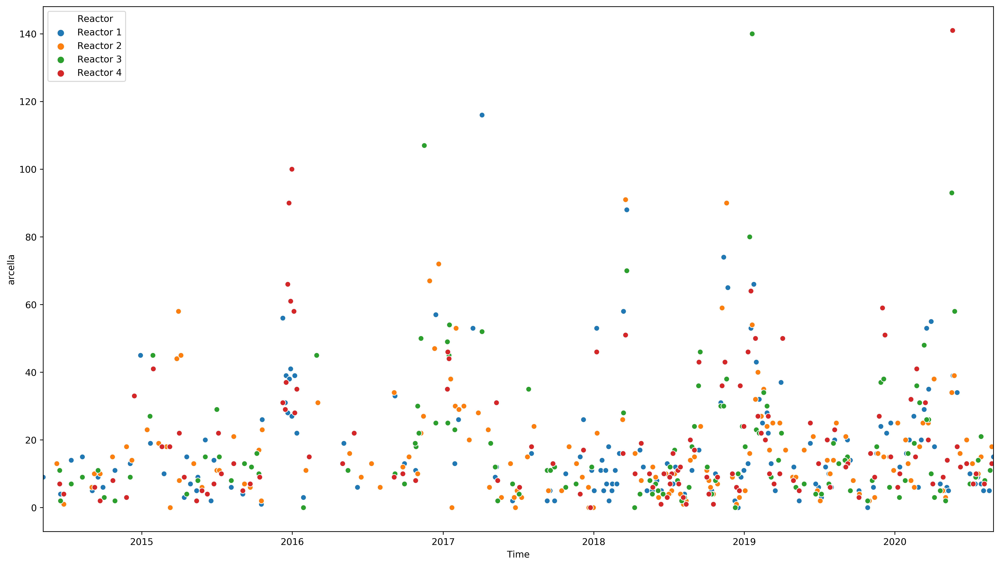

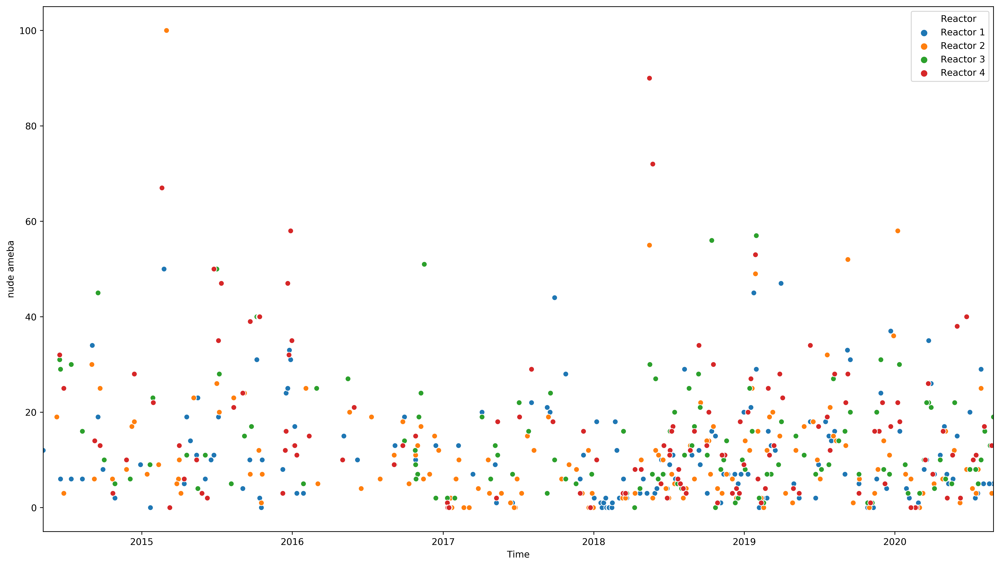

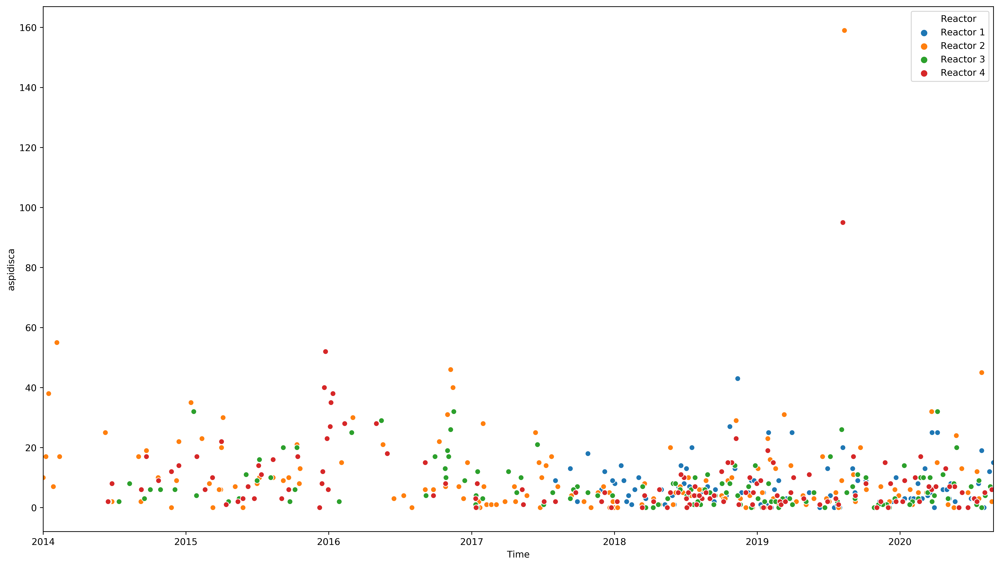

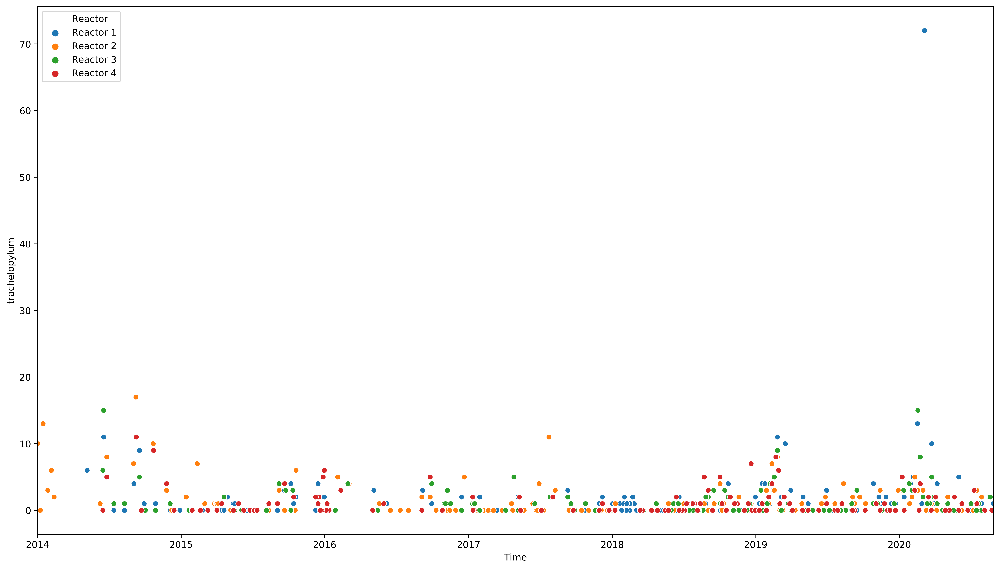

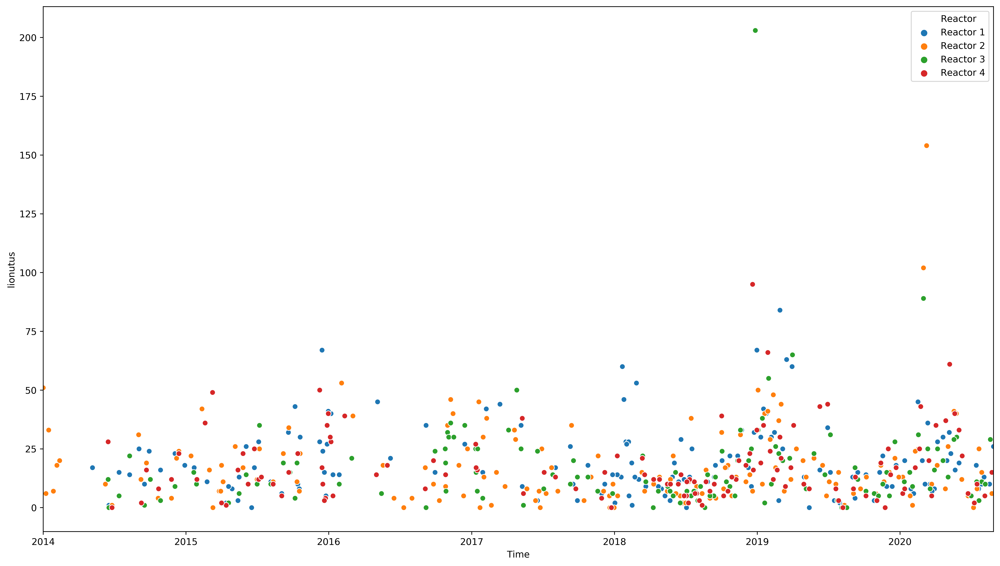

...

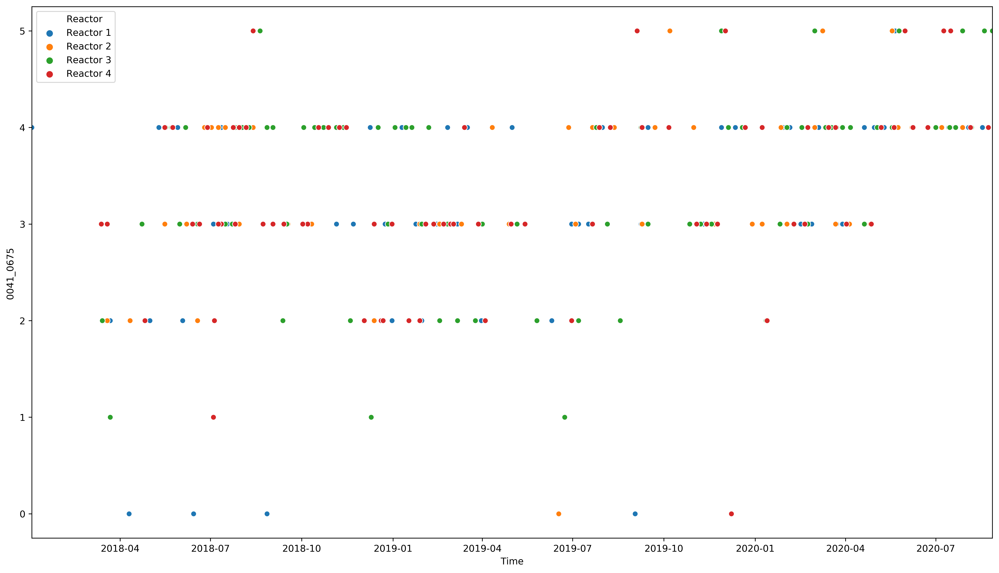

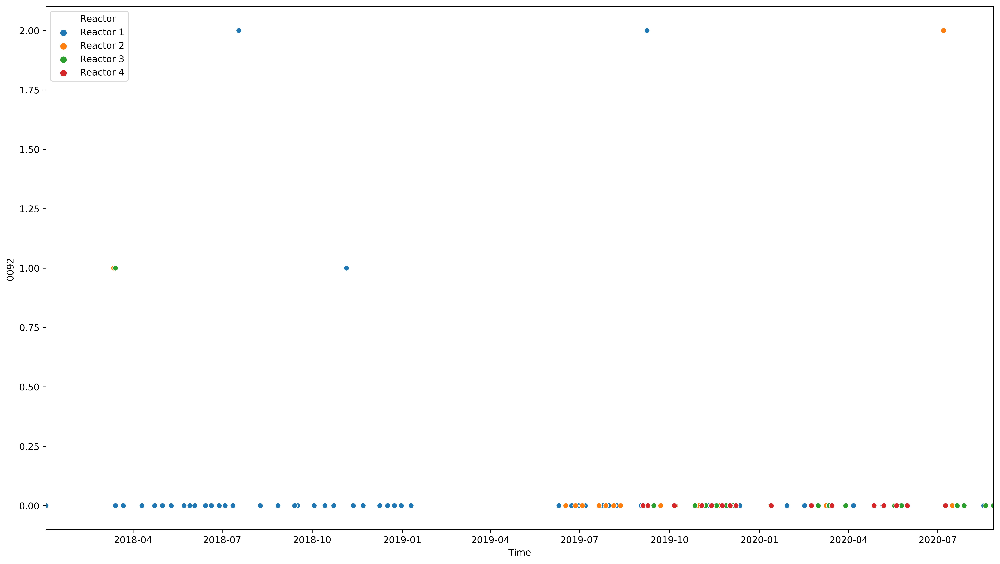

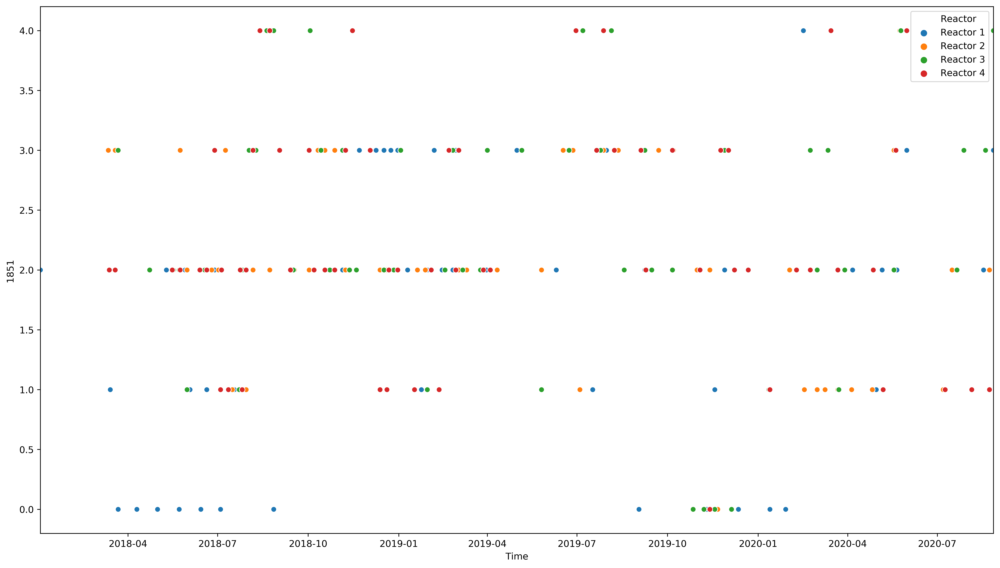

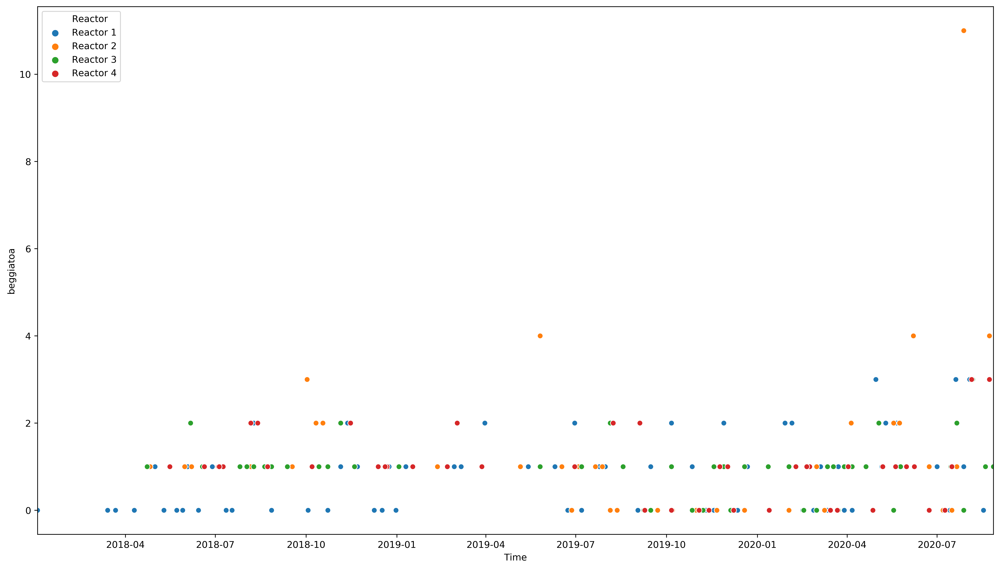

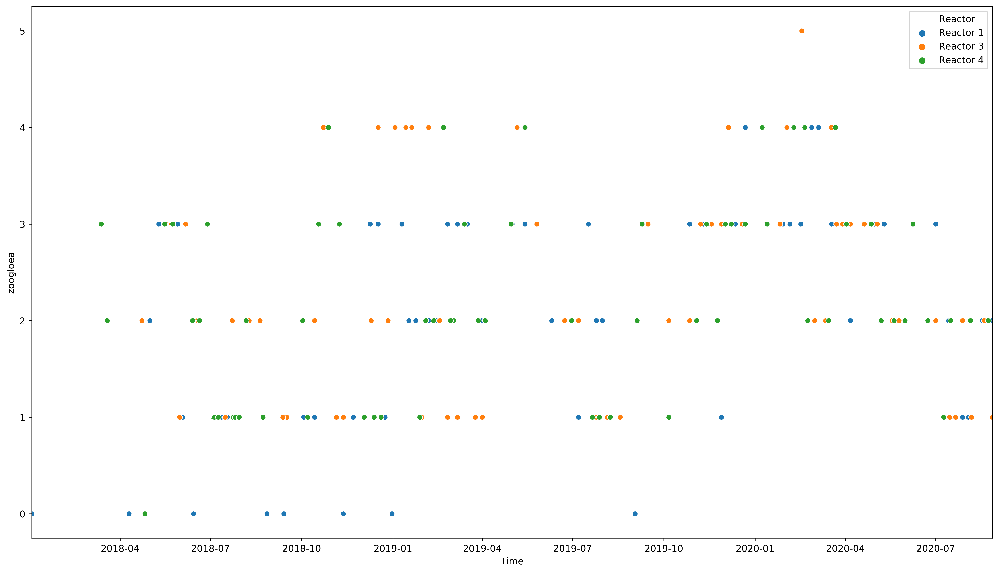

In [243]:
for i in range (0, 27):
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    g = sns.scatterplot(data=micro_df_list[i], x="Time", y=organisms_ist[i], hue="Reactor", ax=ax)
    #g = sns.relplot('Time', 'Arcella', data=arcella_df, hue='Reactor')
    plt.xlim(micro_df_list[i]['Time'].min(), micro_df_list[i]['Time'].max())
    #plt.savefig(f"figures/microscopic_organisms/{organisms_ist[i]}.png", bbox_inches="tight")

In [ ]:
organisms_ist1= [
            "ameoba_arcella",
            "ameoba_nude ameba",
            "crawling ciliates_aspidisca",
            "crawling ciliates_trachelopylum",
            "free swimming ciliates_lionutus",
            "free swimming ciliates_paramecium",
            "stalked ciliate_epistylis",
            "stalked ciliate_vorticella",
            "stalked ciliate_carchecium",
            "stalked ciliate_tokophyra",
            "stalked ciliate_podophyra",
            "stalked ciliate_opercularia",
            "rotifer_rotifer",
            "worms_nematode",
            "worms_worms",
            "flagellates_peranema trich",
            "flagellates_micro flagellates",
            "spirochaetes_spirochaetes",
            "Filaments_Nocardia_index",
            "Filaments_Microthrix_index",
            "Filaments_N. Limicola_index",
            "Filaments_Thiothrix_index",
            "Filaments_0041_0675_index",
            "Filaments_0092_index",
            "Filaments_1851_index",
            "Filaments_beggiatoa_index",
            "Filaments_zoogloea_index",
        ]